In [1]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Camera Calibration

In [3]:
# Function to calibrate camera
def calibrate_camera():
    # Get all files from calibration folder
    file_list = glob.glob('camera_cal/*.jpg')

    # Create empty objpoints (real world points) and imgpoints (image points)
    objpoints = []
    imgpoints = []

    # Initialize positions of a real world points chessboard of the size 6 x 9
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    for filename in file_list:
        img = cv2.imread(filename)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        if ret == True: 
            imgpoints.append(corners)
            objpoints.append(objp)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    return ret, mtx, dist

# Pipeline

#### 1. Provide an example of a distortion-corrected image.

In [4]:
# Display calibrated images
def test_calibration(filename, mtx, dist):
    img = cv2.imread(filename)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    f, (ax11, ax12 ) = plt.subplots(1, 2, figsize=(20,10))
    ax11.set_title('Original')
    ax11.imshow(img)
    ax12.set_title('Undistorted')
    ax12.imshow(dst)
    plt.savefig(filename+"_comparison.png")
    plt.pause(0.01)

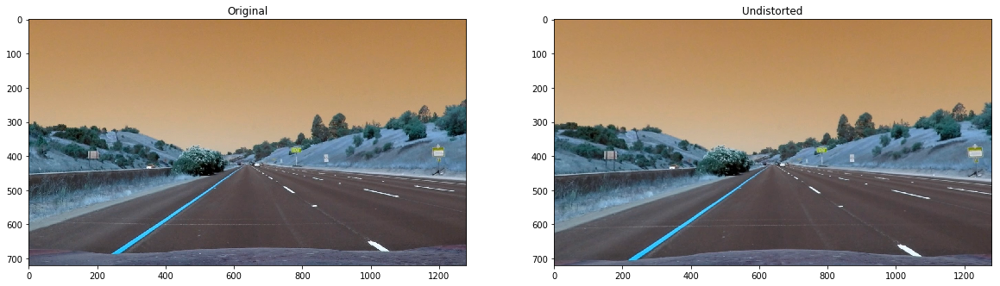

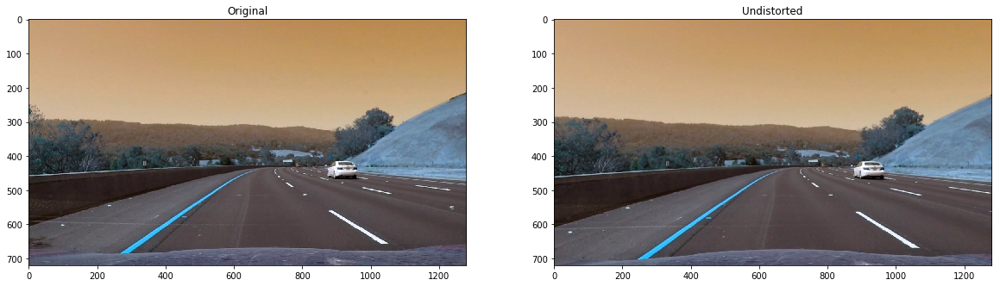

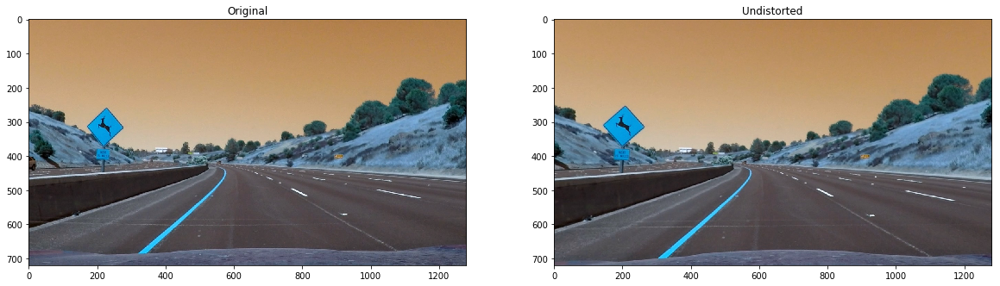

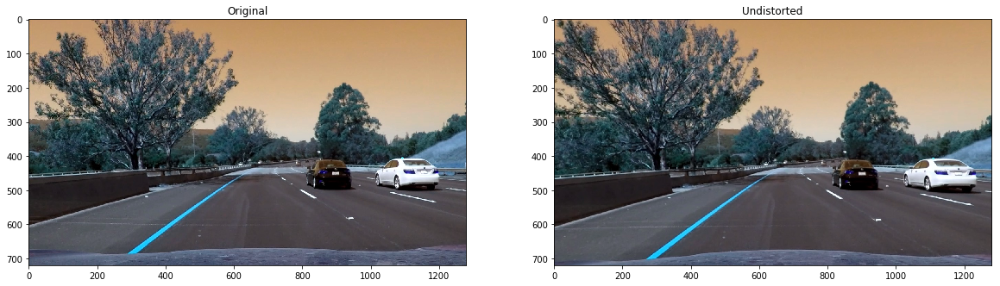

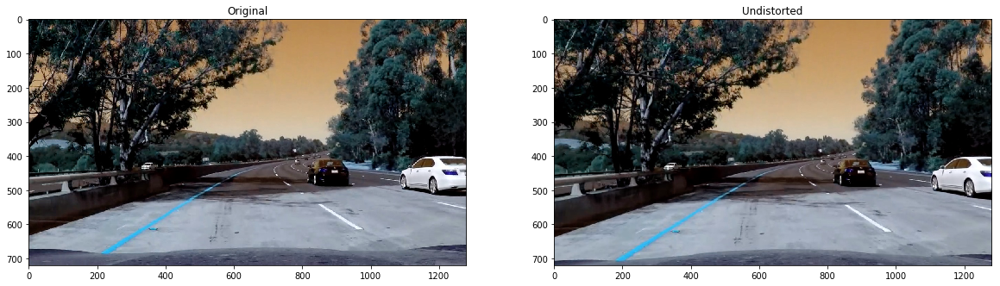

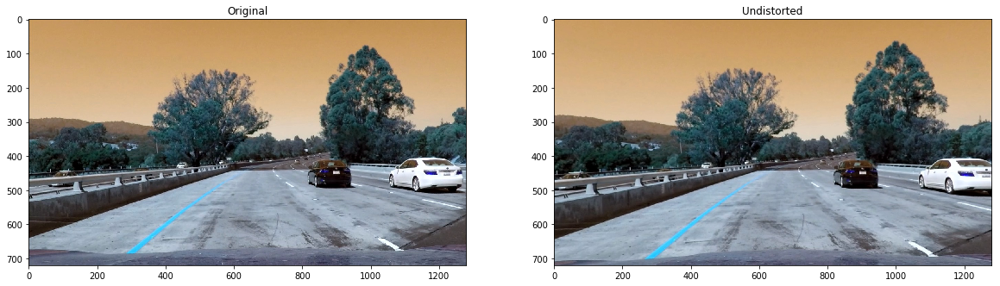

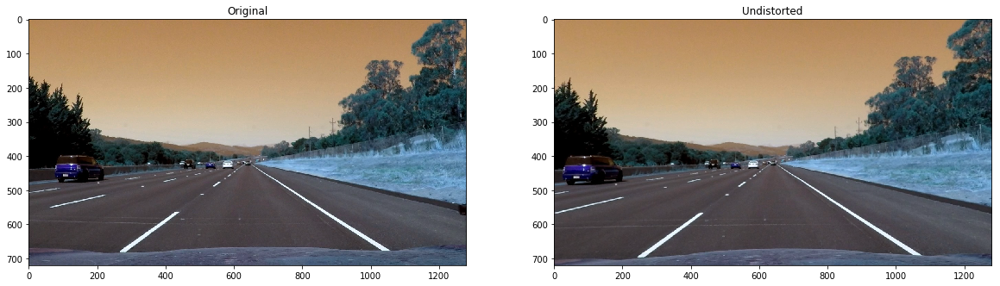

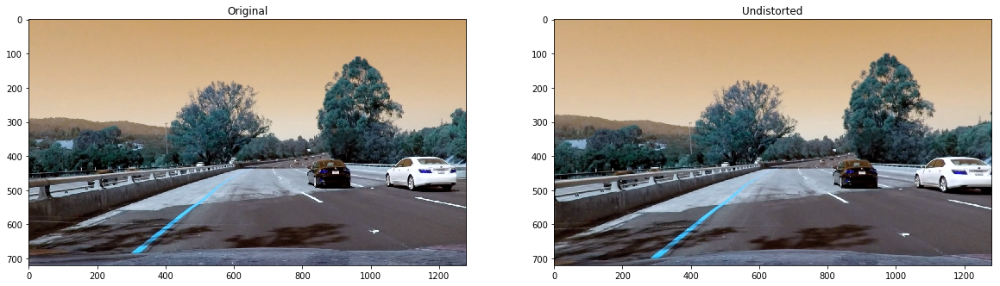

In [5]:
ret, mtx, dist = calibrate_camera()
file_list = glob.glob('test_images/*.jpg')
for filename in file_list:
    test_calibration(filename, mtx, dist)

#### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

In [9]:
def create_binary_image(img):
    rgb_r_channel = img[:,:,0]
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hsv_v_channel = hsv[:,:,2]
        
    # Threshold V channel
    v_thresh_min = 220
    v_thresh_max = 255
    v_binary = np.zeros_like(hsv_v_channel)
    v_binary[(hsv_v_channel >= v_thresh_min) & (hsv_v_channel <= v_thresh_max)] = 1

    
    # Threshold R channel
    r_thresh_min = 220
    r_thresh_max = 255
    r_binary = np.zeros_like(rgb_r_channel)
    r_binary[(rgb_r_channel >= r_thresh_min) & (rgb_r_channel <= r_thresh_max)] = 1
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(v_binary)
    combined_binary[(v_binary == 1) | (r_binary == 1)] = 1
    
    return combined_binary, v_binary, r_binary

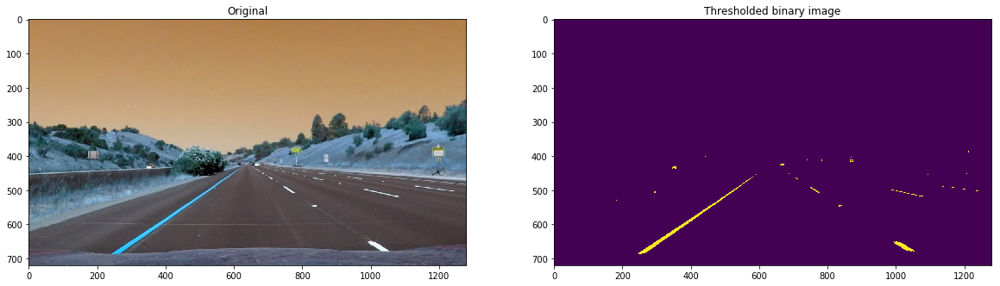

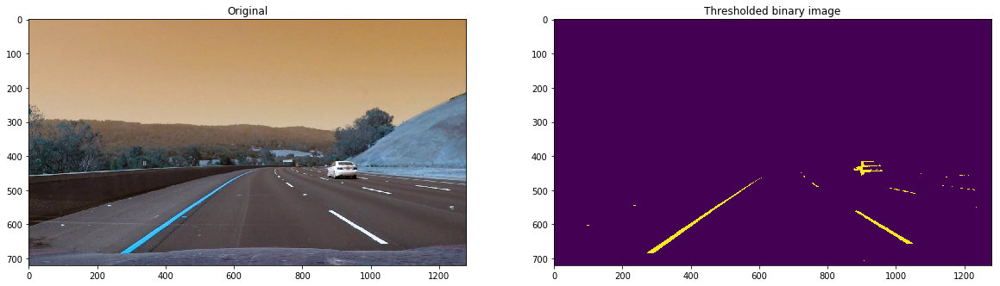

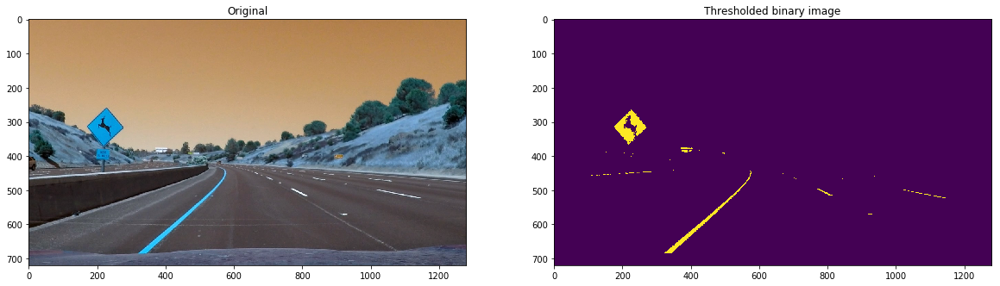

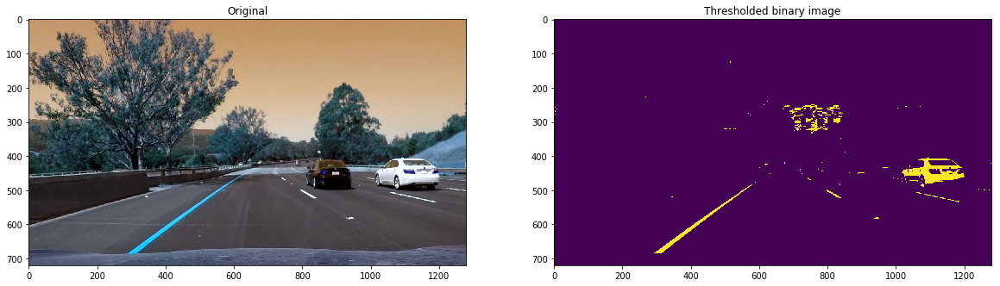

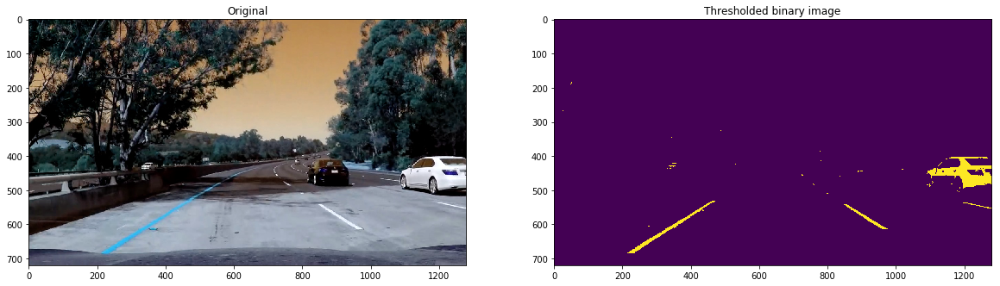

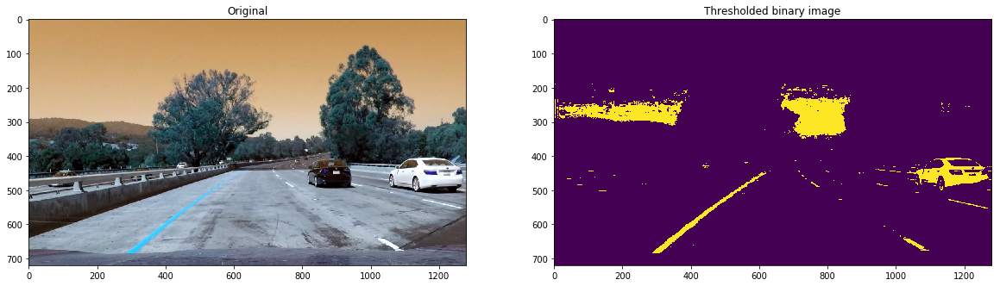

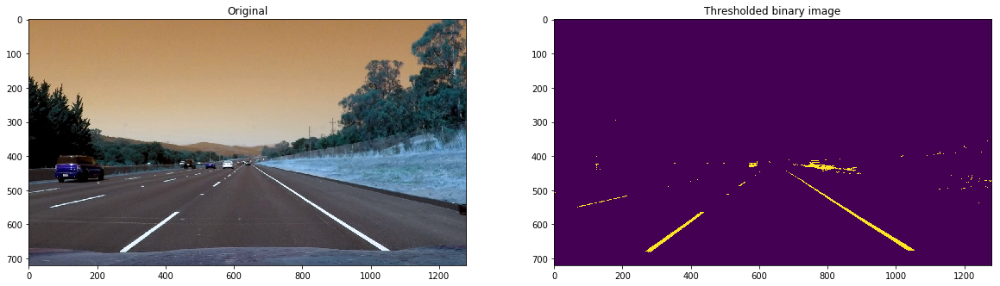

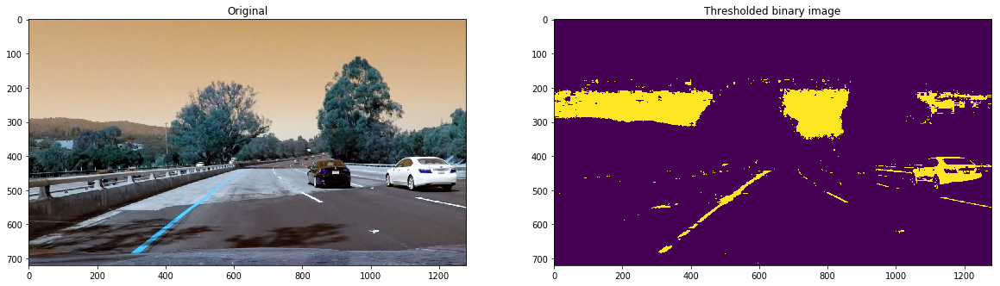

In [10]:
file_list = glob.glob('test_images/*.jpg')

for filename in file_list:
    image = cv2.imread(filename)
    combined_binary, v_binary, r_binary = create_binary_image(image)
    
    f, (ax11, ax12 ) = plt.subplots(1, 2, figsize=(20,10))
    ax11.set_title('Original')
    ax11.imshow(image)
    ax12.set_title('Thresholded binary image')
    ax12.imshow(combined_binary)
    plt.savefig(filename+"_binary.png")
    plt.pause(0.01)
    

#### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

In [11]:
def get_src_dst_points(img):
    img_size = (img.shape[1], img.shape[0])
    bot_width = .76
    mid_width = .08
    height_pct = .62
    bottom_trim = .9999
    
    src_points = np.float32([[img.shape[1]*(.5-mid_width/2), img.shape[0]*height_pct], [img.shape[1]*(.5+mid_width/2), img.shape[0]*height_pct], [img.shape[1]*(.5+bot_width/2), img.shape[0]*bottom_trim], [img.shape[1]*(.5-bot_width/2), img.shape[0]*bottom_trim]])
    offset = img_size[0]*.25
    dst_points = np.float32([[offset,0], [img_size[0]-offset,0], [img_size[0]-offset,img_size[1]], [offset,img_size[1]]])
    
    return src_points, dst_points

In [12]:
def transform_perspective(image, src_points, dst_points):
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped
    

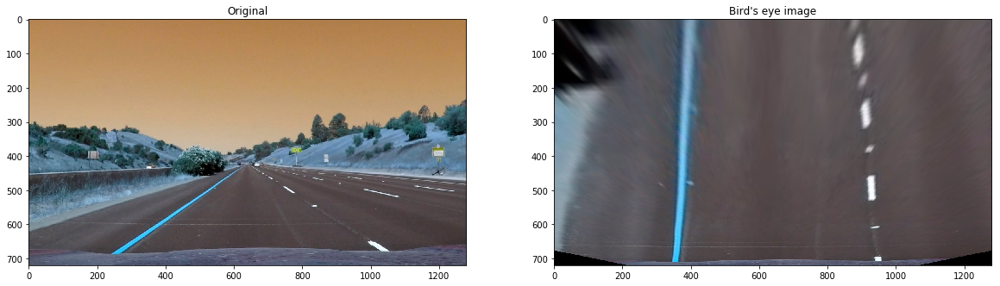

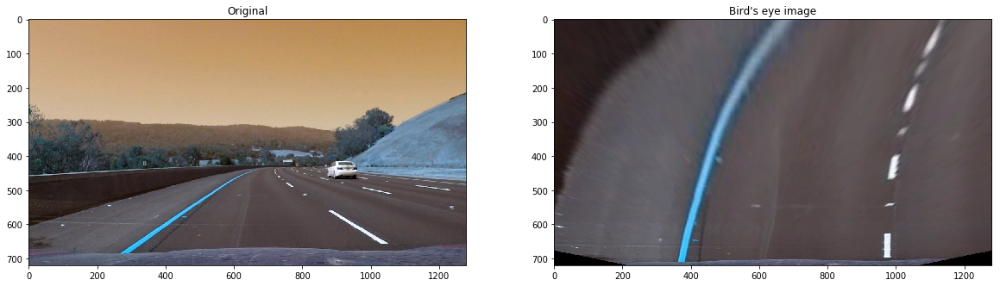

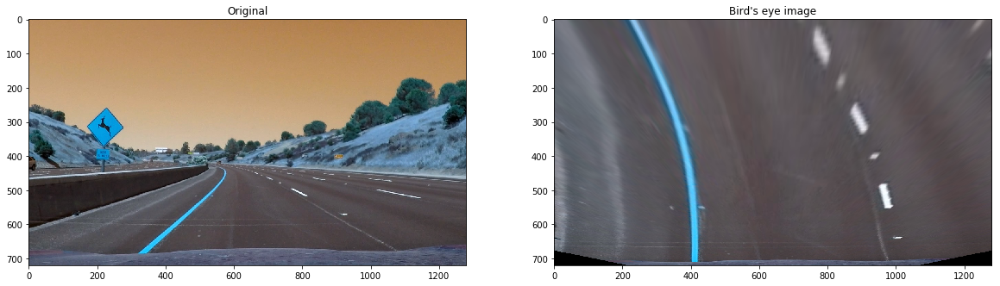

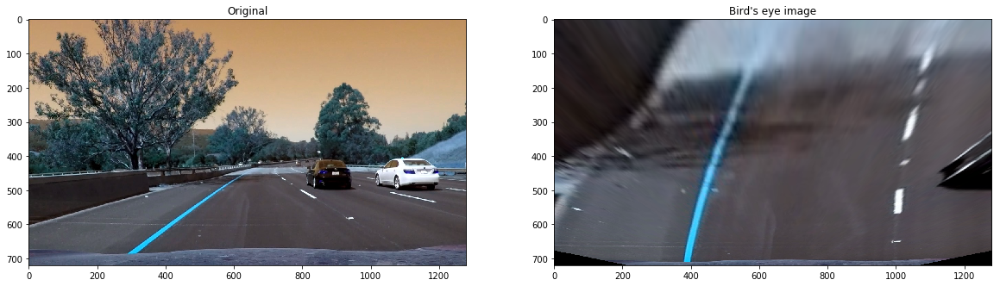

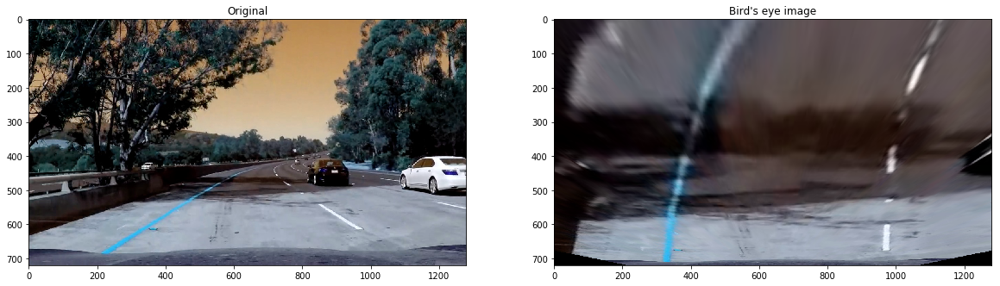

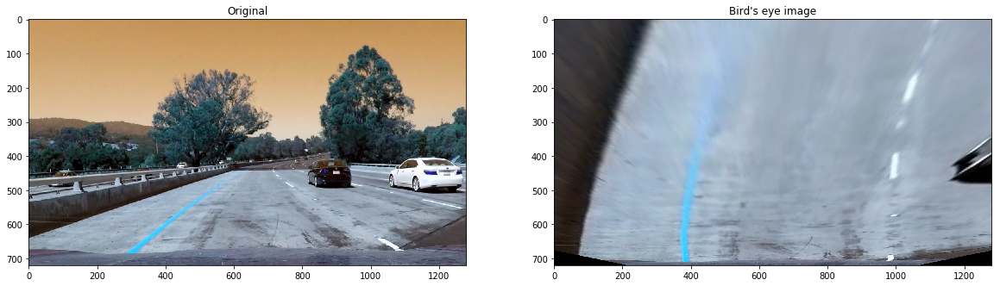

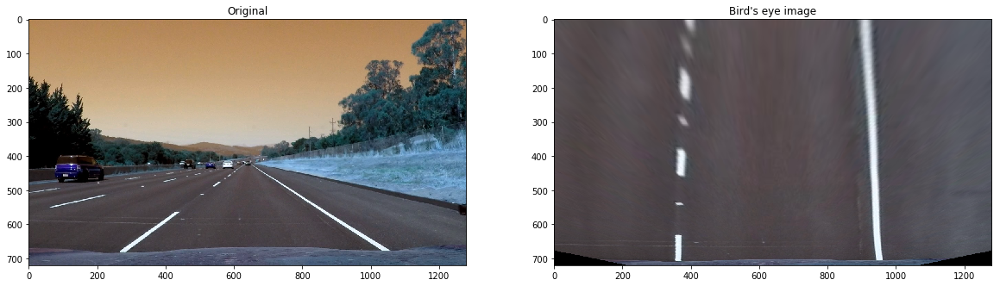

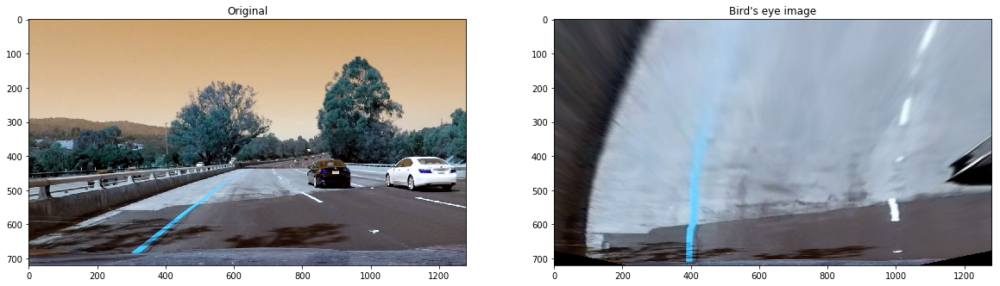

In [13]:
file_list = glob.glob('test_images/*.jpg')

src_points, dst_points = get_src_dst_points(image)

for filename in file_list:
    image = cv2.imread(filename)
    bird_eye_image = transform_perspective(image, src_points, dst_points)
    
    f, (ax11, ax12 ) = plt.subplots(1, 2, figsize=(20,10))
    ax11.set_title('Original')
    ax11.imshow(image)
    ax12.set_title('Bird\'s eye image')
    ax12.imshow(bird_eye_image)
    plt.savefig(filename+"_birds_eye.png")
    plt.pause(0.01)

#### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

In [14]:
def find_lane_pixels(img):
    bottom_half = img[int(img.shape[0]/2):img.shape[0],:]
    histogram = np.sum(bottom_half, axis=0)
    
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(img.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))*255
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        
        # Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin  
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin

        # Get the non zero pixels that fall within the window limits
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Add the points to each of the lanes indices
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # Modify the initial x position for the left and right lanes with the mean position
        if(len(good_left_inds) > (minpix)):
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if(len(good_right_inds) > (minpix)):
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        print("Not able to concatenate")
        pass
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    return leftx, lefty, rightx, righty, out_img

In [15]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    try:
        left_fit = np.polyfit(lefty, leftx,  2)
        right_fit = np.polyfit(righty, rightx, 2)
    except TypeError:
        print('The function has failed to create a polynomial')
        return out_img

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        return out_img

    ## Visualization ##
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.fillPoly(out_img, np.int_([pts]), (0,255, 0))
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    left_curverad = ((1+(2*left_fit[0]*binary_warped.shape[0]*ym_per_pix+left_fit[1])**2)**(3/2))/np.absolute(2*left_fit[0])
    right_curverad = ((1+(2*right_fit[0]*binary_warped.shape[0]*ym_per_pix+right_fit[1])**2)**(3/2))/np.absolute(2*right_fit[0])
    
    left_line_pos = left_fit[0]*binary_warped.shape[0]**2 + left_fit[1]*binary_warped.shape[0] + left_fit[2]
    right_line_pos = right_fit[0]*binary_warped.shape[0]**2 + right_fit[1]*binary_warped.shape[0] + right_fit[2]
    position_from_center = ((left_line_pos+right_line_pos)/2 - binary_warped.shape[1]/2)*3.7/700
        
    return out_img, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center

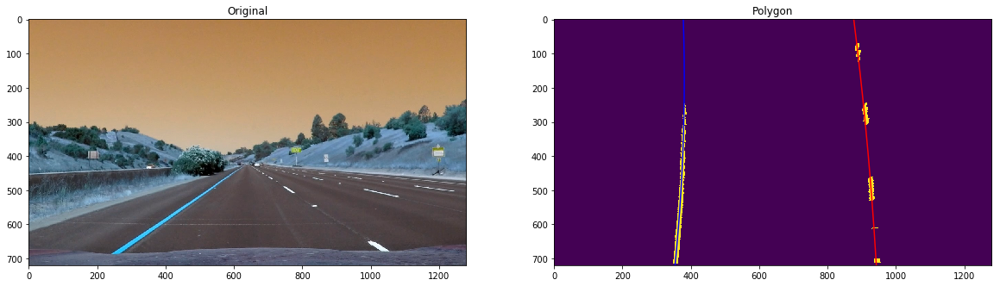

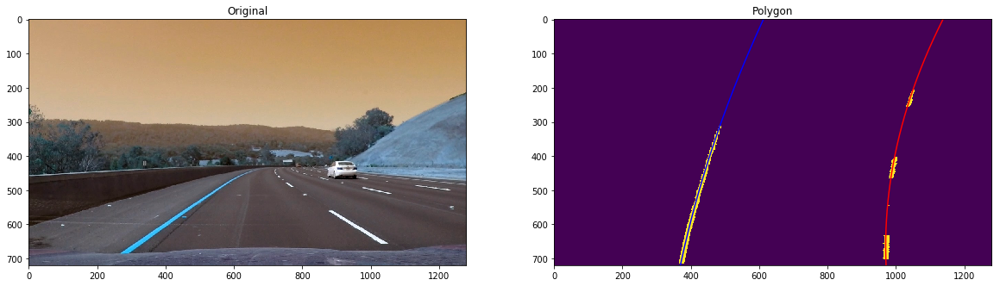

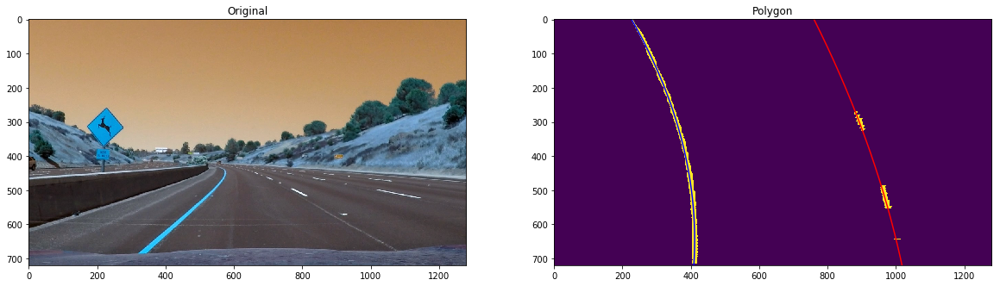

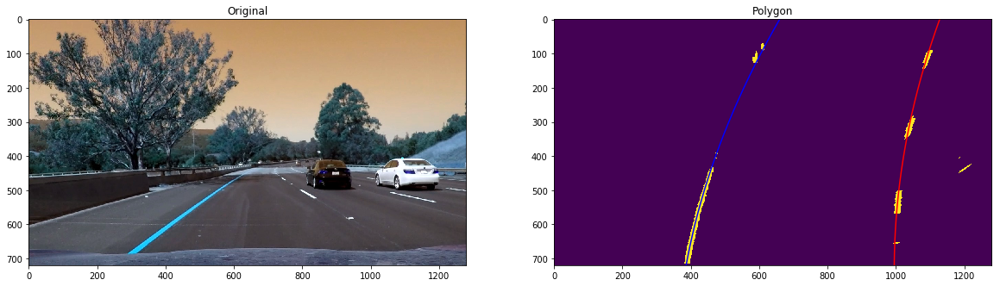

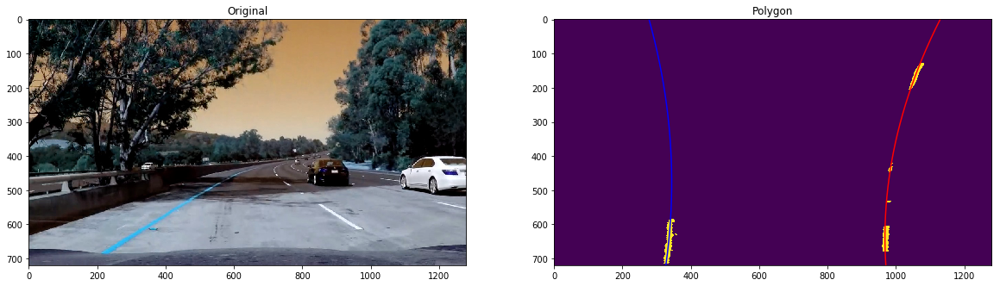

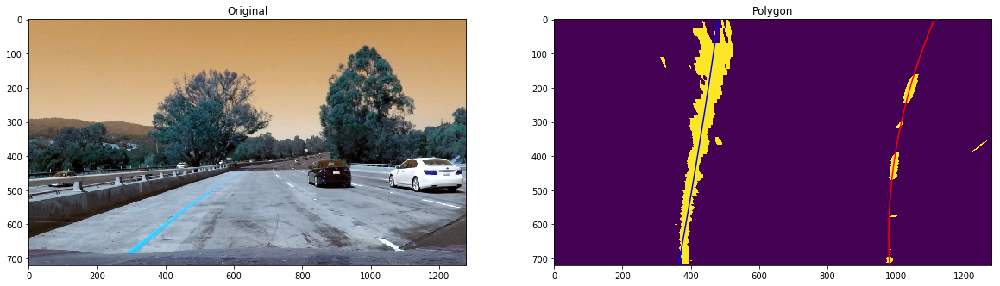

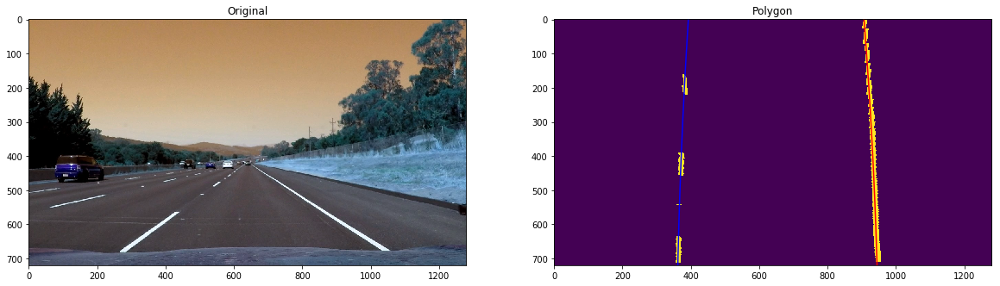

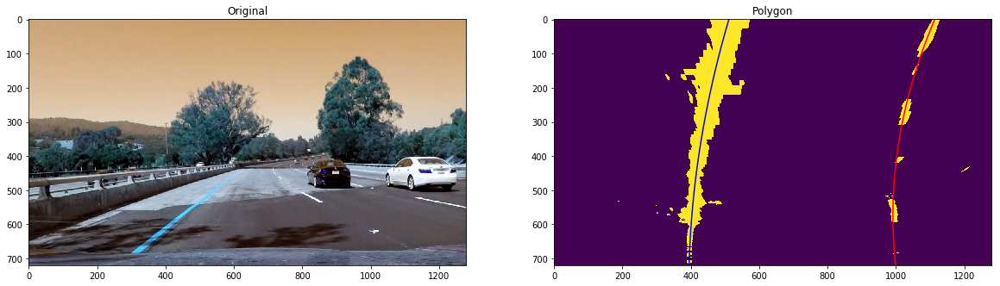

In [16]:
file_list = glob.glob('test_images/*.jpg')

src_points, dst_points = get_src_dst_points(image)

for filename in file_list:
    image = cv2.imread(filename)
    xsize = image.shape[1]
    ysize = image.shape[0]
    src_points, dst_points = get_src_dst_points(image)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    mask_vertices =  np.array([[(.1*xsize,ysize),(.4*xsize, .6*ysize), (.6*xsize, .6*ysize), (.9*xsize, ysize)]], dtype=np.int32)
    masked_image = region_of_interest(undist, mask_vertices)
    combined_binary, v_binary, r_binary = create_binary_image(masked_image)
    bird_eye_image = transform_perspective(combined_binary, src_points, dst_points)
    lane_polygon, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center = fit_polynomial(bird_eye_image)
    
    f, (ax11, ax12 ) = plt.subplots(1, 2, figsize=(20,10))
    ax11.set_title('Original')
    ax11.imshow(image)
    ax12.set_title('Polygon')
    ax12.imshow(bird_eye_image)
    ax12.plot(left_fitx, ploty, color='blue')
    ax12.plot(right_fitx, ploty, color='red')    
    plt.savefig(filename+"_polynomials.png")
    plt.pause(0.01)

#### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

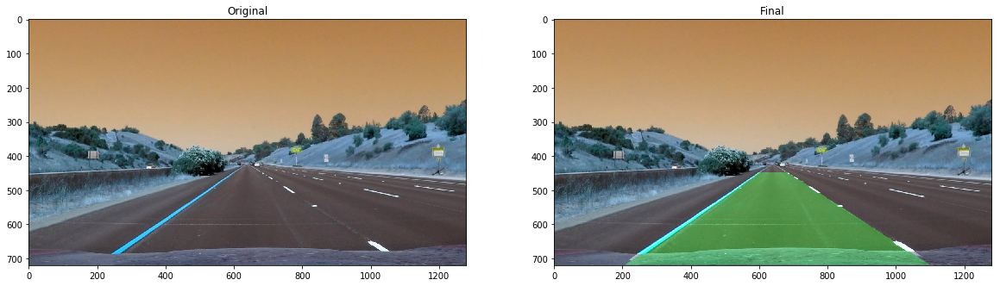

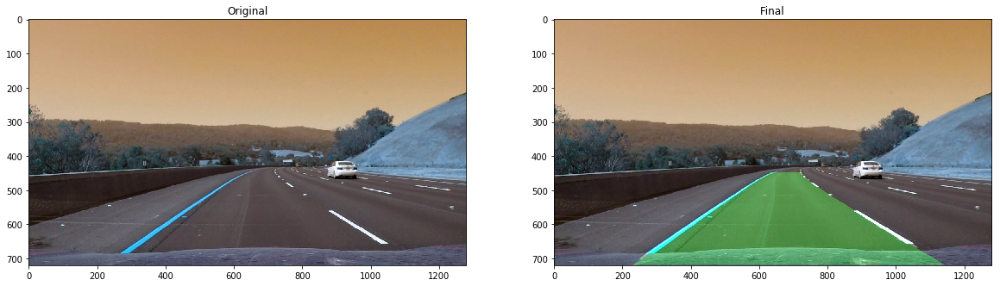

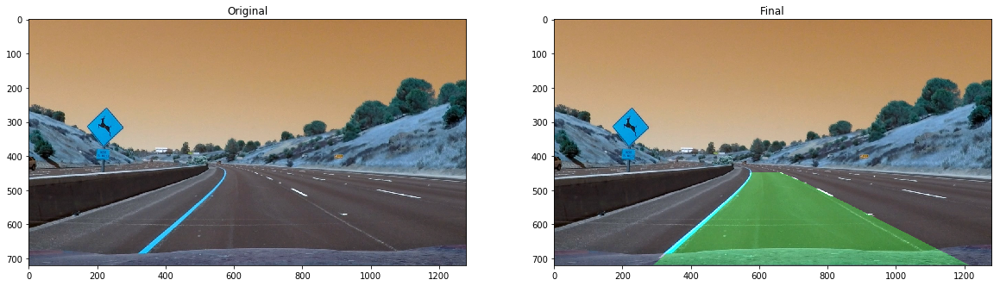

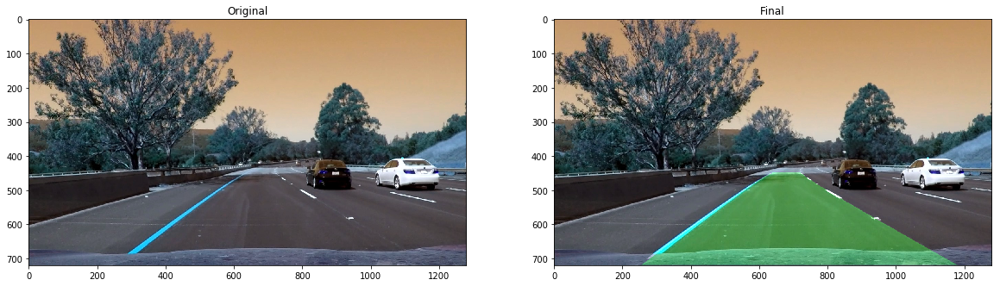

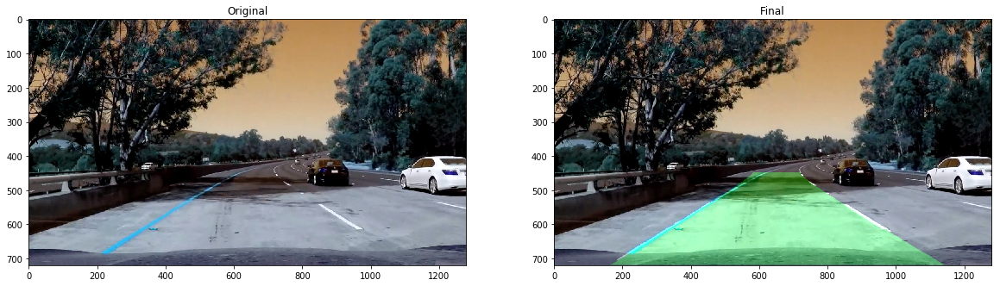

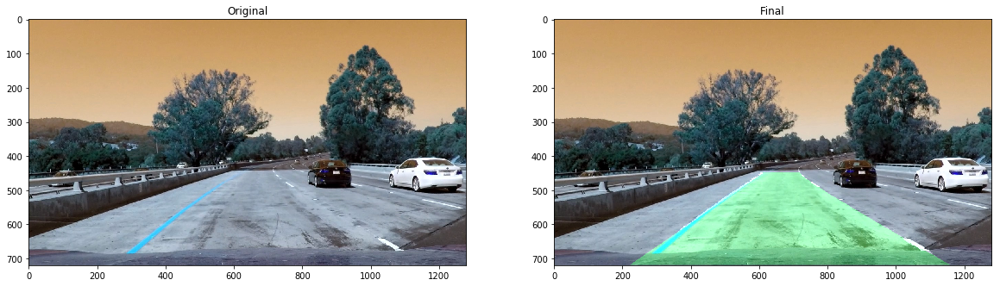

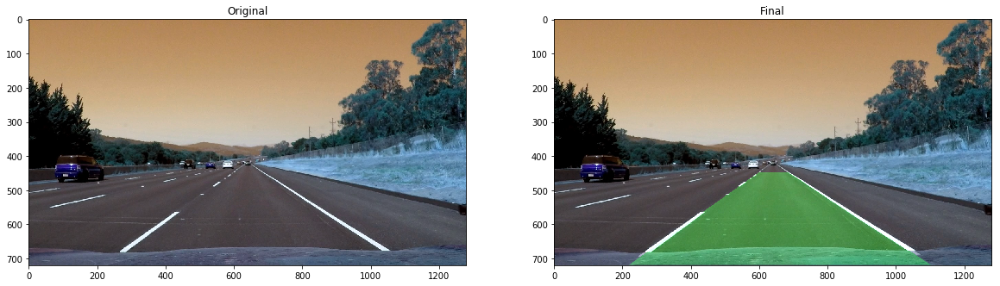

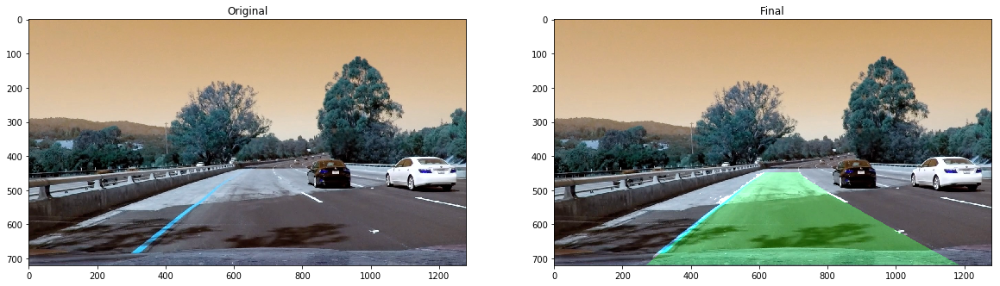

In [17]:
file_list = glob.glob('test_images/*.jpg')

src_points, dst_points = get_src_dst_points(image)

for filename in file_list:
    image = cv2.imread(filename)
    xsize = image.shape[1]
    ysize = image.shape[0]
    src_points, dst_points = get_src_dst_points(image)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    mask_vertices =  np.array([[(.1*xsize,ysize),(.4*xsize, .6*ysize), (.6*xsize, .6*ysize), (.9*xsize, ysize)]], dtype=np.int32)
    masked_image = region_of_interest(undist, mask_vertices)
    combined_binary, v_binary, r_binary = create_binary_image(masked_image)
    bird_eye_image = transform_perspective(combined_binary, src_points, dst_points)
    lane_polygon, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center = fit_polynomial(bird_eye_image)
    lane_polygon = transform_perspective(lane_polygon, dst_points, src_points)
    result = cv2.addWeighted(image, 1, lane_polygon, .3, 0)
    
    f, (ax11, ax12 ) = plt.subplots(1, 2, figsize=(20,10))
    ax11.set_title('Original')
    ax11.imshow(image)
    ax12.set_title('Final')
    ax12.imshow(result)
    plt.savefig(filename+"_final.png")
    plt.pause(0.01)
    



# Pipeline (video)


In [30]:
def process_image(image):
    global mtx
    global dist
    
    src_points, dst_points = get_src_dst_points(image)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    mask_vertices =  np.array([[(.1*xsize,ysize),(.4*xsize, .6*ysize), (.6*xsize, .6*ysize), (.9*xsize, ysize)]], dtype=np.int32)
    masked_image = region_of_interest(undist, mask_vertices)
    combined_binary, v_binary, r_binary = create_binary_image(masked_image)
    bird_eye_image = transform_perspective(combined_binary, src_points, dst_points)
    lane_polygon, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center = fit_polynomial(bird_eye_image)
    lane_polygon = transform_perspective(lane_polygon, dst_points, src_points)
    cv2.putText(image,'Left Curverad: '+str(left_curverad),(10,50), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(image,'Right Curverad: '+str(right_curverad),(10,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2,cv2.LINE_AA)
    cv2.putText(image,'Distance from center: '+str(position_from_center),(10,150), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2,cv2.LINE_AA)
    result = cv2.addWeighted(image, 1, lane_polygon, .3, 0)
    return result

In [31]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [32]:
ret, mtx, dist = calibrate_camera()
  
white_output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [07:07<00:00,  3.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 48min 36s, sys: 8.58 s, total: 48min 44s
Wall time: 7min 7s


In [28]:
# Code to display the output video, commented to save space when uploading the notebook to Github
# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(white_output))

In [29]:
ret, mtx, dist = calibrate_camera()
  
white_output = 'challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

The function has failed to create a polynomial


ValueError: too many values to unpack (expected 7)

In [2]:
# Code to display the output video, commented to save space when uploading the notebook to Github

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(white_output))

In [ ]:
ret, mtx, dist = calibrate_camera()
src_points = np.float32([[470, 500], [img.shape[1]-470, 500], [img.shape[1], img.shape[0]], [0, img.shape[0]]])
dst_points = np.float32([[0,0], [img.shape[1],0], [img.shape[1],img.shape[0]], [0,img.shape[0]]])
   
white_output = 'harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [3]:
# Code to display the output video, commented to save space when uploading the notebook to Github

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(white_output))

In [4]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def export_frames(clip):
    global video_name
    global frame_number
    n_frames = sum(1 for x in clip.iter_frames())
    print(clip.duration)
    print n_frames
    for second in range(0, 10*int(clip.duration)):
        clip.save_frame(video_name+'_'+str(second).zfill(5)+'.png', t=second/10.0)
        
    
video_name = 'project_video'
frame_number = 0
clip = VideoFileClip("project_video.mp4")
export_frames(clip)

SyntaxError: Missing parentheses in call to 'print'. Did you mean print(clip.duration)? (<ipython-input-4-91af18c2f4f9>, line 9)